# **Word2Vec Embedding Multi-domain Sentiment Dataset**
Download data:
[https://www.cs.jhu.edu/~mdredze/datasets/sentiment/](https://www.cs.jhu.edu/~mdredze/datasets/sentiment/)

## **Import basic libraries** ##

In [ ]:
"""
Data Loader for MDSD Dataset
"""
import os
import re
import numpy as np
from tqdm import tqdm

import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


## **Load Data**

### Get data folder from Google Drive ###

Mount Drive folder to Google Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Change directory to Data Folder

In [ ]:
DATA_FOLDER = '/content/drive/MyDrive/USYD/Datasets/AMAZON_REVIEW/proceesed_data_20210830/'
!pwd

/content


Assign data folder path to a global variable

In [ ]:
# Set amazon_review path here!
MDSD_PATH = os.path.expanduser(DATA_FOLDER)
assert os.path.exists(MDSD_PATH)

### Set list of domains ###

Generate domain map (Total 20 domains)

In [ ]:
domain_map = {
    'books': 0,
    'dvd': 1,
    'electronics': 2,
    'kitchen': 3,
    'computer_&_video_games': 4,
    'beauty': 5,
    'baby': 6,
    'software': 7,
    'magazines': 8,
    'camera_&_photo': 9,
    'music': 10,
    'video': 11,
    'health_&_personal_care': 12,
    'toys_&_games': 13,
    'sports_&_outdoors': 14,
    'apparel': 15,
    'gourmet_food': 16,
    'jewelry_&_watches': 17,
    'outdoor_living': 18,
    'grocery': 19,
}

Choose necessary domains

In [ ]:
# Domain map
DOMAINS = ('books', 'dvd', 'electronics', 'kitchen')

### Define some util functions ###

In [ ]:
!pip install transformers
from xml.dom import minidom
from typing import AnyStr
from typing import List
from typing import Tuple
import unicodedata
import pandas as pd
import json
import glob

import torch
from torch.utils.data import Dataset
from transformers import PreTrainedTokenizer


In [ ]:
def text_to_batch_transformer(text: List, tokenizer: PreTrainedTokenizer, text_pair: AnyStr = None) -> Tuple[List, List]:
    """Turn a piece of text into a batch for transformer model

    :param text: The text to tokenize and encode
    :param tokenizer: The tokenizer to use
    :param: text_pair: An optional second string (for multiple sentence sequences)
    :return: A list of IDs and a mask
    """
    if text_pair is None:
        input_ids = [tokenizer.encode(t, add_special_tokens=True, max_length=tokenizer.model_max_length) for t in text]
    else:
        input_ids = [tokenizer.encode(t, text_pair=p, add_special_tokens=True, max_length=tokenizer.model_max_length) for t,p in zip(text, text_pair)]

    masks = [[1] * len(i) for i in input_ids]

    return input_ids, masks


def collate_batch_transformer(input_data: Tuple) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    input_ids = [i[0][0] for i in input_data]
    masks = [i[1][0] for i in input_data]
    labels = [i[2] for i in input_data]
    domains = [i[3] for i in input_data]

    max_length = max([len(i) for i in input_ids])

    input_ids = [(i + [0] * (max_length - len(i))) for i in input_ids]
    masks = [(m + [0] * (max_length - len(m))) for m in masks]

    assert (all(len(i) == max_length for i in input_ids))
    assert (all(len(m) == max_length for m in masks))
    return torch.tensor(input_ids), torch.tensor(masks), torch.tensor(labels), torch.tensor(domains)


def collate_batch_transformer_with_index(input_data: Tuple) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor, List]:
    return collate_batch_transformer(input_data) + ([i[-1] for i in input_data],)

def decontracted(phrase):
    phrase = re.sub(r"won't","will not",phrase)
    phrase = re.sub(r"can't","can not",phrase)
    phrase = re.sub(r"doesn't","does not",phrase)
    phrase = re.sub(r"n\'t","not",phrase)
    phrase = re.sub(r"\'re","are",phrase)
    phrase = re.sub(r"\'s","is",phrase)
    phrase = re.sub(r"\'d","would",phrase)
    phrase = re.sub(r"\'ll","will",phrase)    
    phrase = re.sub(r"\'t","not",phrase)
    phrase = re.sub(r"\'ve","have",phrase)
    phrase = re.sub(r"\'m","am",phrase)
    return phrase

def read_xml(dir: AnyStr, domain: AnyStr, split: AnyStr = 'positive'):
    """ Convert all of the ratings in amazon product XML file to dicts

    :param xml_file: The XML file to convert to a dict
    :return: All of the rows in the xml file as dicts
    """
    reviews = []
    split_map = {'positive': 1, 'negative': 0, 'unlabelled': -1}
    in_review_text = False
    with open(f'{dir}/{domain}/{split}.review', encoding='utf8', errors='ignore') as f:
        for line in f:
            if '<review_text>' in line:
                reviews.append({'text': '', 'label': split_map[split], 'domain': domain_map[domain]})
                in_review_text = True
                continue
            if '</review_text>' in line:
                in_review_text = False
                # Normalize text
                reviews[-1]['text'] = reviews[-1]['text'].replace('\n', ' ').strip()
                reviews[-1]['text'] = re.sub(r"http\S+"," ",reviews[-1]['text'])
                reviews[-1]['text'] = BeautifulSoup(reviews[-1]['text'],'lxml').get_text()
                cleanr = re.compile('<.*?>')
                reviews[-1]['text'] = re.sub(cleanr,' ',reviews[-1]['text'])
                reviews[-1]['text'] = decontracted(reviews[-1]['text'])
                reviews[-1]['text'] = re.sub("\S\*\d\S*"," ",reviews[-1]['text'])
                reviews[-1]['text'] = re.sub("[^A-Za-z]+"," ",reviews[-1]['text'])
                reviews[-1]['text'] = re.sub(r'\s+', ' ', reviews[-1]['text'])
                reviews[-1]['text'] = re.sub(r'[?|!|\'|"|#]',r' ',reviews[-1]['text'])
                reviews[-1]['text'] = re.sub(r'[.|,|)|(|\|/]',r' ',reviews[-1]['text'])
                reviews[-1]['text'] = reviews[-1]['text'].lower()
            if in_review_text:
                reviews[-1]['text'] += line
    return reviews


## **Load Data**

In [ ]:
amazon_book = pd.read_csv(DATA_FOLDER + 'CSV/Amazon_Book.csv',sep = '\t')
amazon_dvd = pd.read_csv(DATA_FOLDER + 'CSV/Amazon_DVD.csv',sep = '\t')
amazon_electronic = pd.read_csv(DATA_FOLDER + 'CSV/Amazon_Electronic.csv',sep = '\t')
amazon_kitchen = pd.read_csv(DATA_FOLDER + 'CSV/Amazon_Kitchen.csv',sep = '\t')

In [ ]:
amazon_book = amazon_book[['text', 'label']]
amazon_book.head(n=10)

,text,label
0,bridget jones modern day woman brillant and do...,1
1,i am ordering copies for all middle school pri...,1
2,as a casual piano player and a broadway fanati...,1
3,this is one of the best biographies i have eve...,1
4,i read this book many many years ago on a very...,1
5,this book was someone elseis bookclub selectio...,1
6,i have been studing leadership for over years ...,1
7,the best book on the history of world war ii t...,1
8,refers to cd recording after picking up and p...,1
9,zadie smith is one of the most powerful author...,1


In [ ]:
amazon_dvd = amazon_dvd[['text', 'label']]
amazon_dvd.head(n=10)

,text,label
0,the story of alice in wonderland was controver...,1
1,i covered a similar theme in my international ...,1
2,i saw the scene where they have lissa chained ...,1
3,at years of age i can truly say that i have be...,1
4,we have all of the series that have been relea...,1
5,this is a great dvd for all collections even i...,1
6,of people found the following review helpful ...,1
7,julia plays a struggling mother trying to make...,1
8,this film can be interpreted any number of way...,1
9,i tried to rent this dvd from an online servic...,1


In [ ]:
amazon_electronic = amazon_electronic[['text', 'label']]
amazon_electronic.head(n=10)

,text,label
0,i received my kingston mb sd card just as adve...,1
1,works well especially for anyone who still has...,1
2,not as easy to use as a larger panasonic i use...,1
3,it worked much better than expected the page c...,1
4,itis speedy and space saving and inexpensive i...,1
5,ihave had a number of universal remotes over t...,1
6,i really donot have much to say about this boo...,1
7,after using my im s for about months now i hav...,1
8,this is perfect for my ipod and keeps it total...,1
9,always something that might come in handy my l...,1


In [ ]:
amazon_kitchen = amazon_kitchen[['text', 'label']]
amazon_kitchen.head(n=10)

,text,label
0,my grandmais year old yorkie just would never ...,1
1,i am looking for a new book light and as a for...,1
2,i have a year old boxer that barks cries whine...,1
3,i received great customer service and a beauti...,1
4,i found this to be bright enough for me to rea...,1
5,the bissell flip it saves me a lot of time cle...,1
6,as most people do i had accumulated several di...,1
7,i picked up a dozen in home depot for less tha...,1
8,after reading every review on deep fryers i co...,1
9,this was my first calaphalon purchase and i am...,1


## **Preprocessing**

Why do you need to preprocess this text? — Not all the information is useful in making predictions or doing classifications. 

Reducing the number of words will reduce the input dimension to your model. The way the language is written, it contains lot of information which is grammar specific. Thus when converting to numeric format, word specific characteristics like capitalisation, punctuations, suffixes/prefixes etc. are redundant. 

Cleaning the data in a way that similar words map to single word and removing the grammar relevant information from text can tremendously reduce the vocabulary. Which methods to apply and which ones to skip depends on the problem at hand.

Preprocessing involves many steps like tokenization, removing stop words, stemming/lemmatization etc.

### **1. Tokenization** ###

Tokenization is the process in which the sentence/text is split into array of words called tokens. This helps to do transformations on each words separately and this is also required to transform words to numbers. There are different ways of performing tokenization.

Gensim’s simple_preprocess allows you to convert text to lower case and remove punctuations. It has min and max length parameters as well which help to filter out rare words and most commonly words which will fall in that range of lengths.

Here, simple_preprocess is used to get the tokens for the dataframe as it does most of the preprocessing already for us. Let’s apply this method to get the tokens for the dataframe:

In [ ]:
import nltk
from nltk.tokenize import word_tokenize,sent_tokenize
from nltk.tokenize import RegexpTokenizer

nltk.download('punkt')
#nltk.download()
#nltk.download('punkt')
def decontracted(phrase):
    phrase = re.sub(r"won't","will not",phrase)
    phrase = re.sub(r"can't","can not",phrase)
    phrase = re.sub(r"doesn't","does not",phrase)
    phrase = re.sub(r"n\'t","not",phrase)
    phrase = re.sub(r"\'re","are",phrase)
    phrase = re.sub(r"\'s","is",phrase)
    phrase = re.sub(r"\'d","would",phrase)
    phrase = re.sub(r"\'ll","will",phrase)    
    phrase = re.sub(r"\'t","not",phrase)
    phrase = re.sub(r"\'ve","have",phrase)
    phrase = re.sub(r"\'m","am",phrase)
    return phrase

def tokenize_words_Sents(Sent):
    # Sent='  '.join(snow.stem(e.lower()) for e in Sent.split() if e.lower() not in stop)
    return word_tokenize(Sent),sent_tokenize(Sent)

def tokenize_words(Sent):
    return word_tokenize(Sent)   
    
def RegExpTokenizer(Sent):
    tokenizer = RegexpTokenizer(r'\w+')


Words,Sents = tokenize_words_Sents(amazon_book['text'][0])

Words_2 = RegExpTokenizer(amazon_book['text'][0])
print("Words ",Words)
print("Sents ",Sents)
print("Words_2 ",Sents)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
Words  ['bridget', 'jones', 'modern', 'day', 'woman', 'brillant', 'and', 'does', 'not', 'know', 'it', 'prone', 'to', 'accidents', 'and', 'mess', 'ups', 'but', 'manages', 'to', 'come', 'out', 'of', 'them', 'this', 'is', 'the', 'book', 'that', 'started', 'it', 'all', 'with', 'the', 'chick', 'lit', 'fever', 'bridget', 'jones', 'is', 'my', 'hero']
Sents  ['bridget jones modern day woman brillant and does not know it prone to accidents and mess ups but manages to come out of them this is the book that started it all with the chick lit fever bridget jones is my hero']
Words_2  ['bridget jones modern day woman brillant and does not know it prone to accidents and mess ups but manages to come out of them this is the book that started it all with the chick lit fever bridget jones is my hero']


### **2. Removal of Stop Words** ###

Stop words are the words which are commonly used and removed from the sentence as pre-step in different Natural Language Processing (NLP) tasks. Example of stop words are: ‘a’, ‘an’, ‘the’, ‘this’, ‘not’ etc. Every tool uses a bit different set of stop words list that it removes but this technique is avoided in cases where phrase structure matters like in this case of Sentiment Analysis.

NLTk offers English most popular StopWords with **stop_words**

In [ ]:
from nltk.corpus import stopwords
nltk.download('stopwords')

stop_words = set(stopwords.words("english"))

no_stopwords =["against","aren't","couldn't",'didn',"didn't", "doesn't", "don't", 
              'few', "hadn't", "hasn't", "haven't","isn't" ,'just',"mightn't",
              'more','most', "mustn't","no","nor","not","needn't","once","out",
              "wasn't","weren't", "won't" , 'won', "wouldn't",'why','any','only','very']

no_stopwords_1 = ["not","don't",'aren','don','ain',"aren't", 'couldn', "couldn't", 'didn', 
                "didn't", 'doesn', "doesn't", 'hadn', "hadn't", 'hasn', "hasn't", 'haven', 
                "haven't", 'isn', "isn't",'ma', 'mightn', "mightn't", 'mustn', "mustn't", 
                'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 
                'weren', "weren't","won't", 'wouldn', "wouldn't"]

modified_stopwords = list(set(stop_words) - set(no_stopwords_1))


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Stop Words Cloud

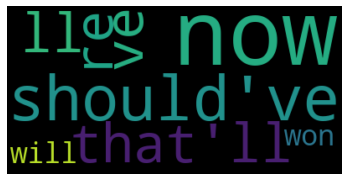

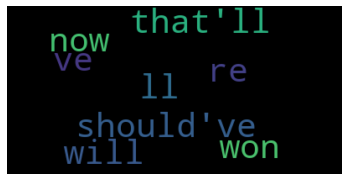

In [ ]:
from wordcloud import WordCloud

# Generate a word cloud image
wordcloud = WordCloud().generate(' '.join(modified_stopwords))

# Display the generated image:
# the matplotlib way:
import matplotlib.pyplot as plt
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")

# lower max_font_size
wordcloud = WordCloud(max_font_size=40).generate(' '.join(modified_stopwords))
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [ ]:
def Eliminate_Stop_Words(Sent):
    filtered_words = []
    for w in Sent:
        if w not in modified_stopwords:
            filtered_words.append(w)
    return modified_stopwords,filtered_words

def Eliminate_Stop_Word(Sent):
    filtered_words = []
    for w in Sent:
        if w not in modified_stopwords:
            filtered_words.append(w)
    return filtered_words

filtered_words = Eliminate_Stop_Word(Words)
print("------------------Words ------------------------")
print(Sents)
print("------------------Words filltred---------------------")
print(filtered_words)

------------------Words ------------------------
['bridget jones modern day woman brillant and does not know it prone to accidents and mess ups but manages to come out of them this is the book that started it all with the chick lit fever bridget jones is my hero']
------------------Words filltred---------------------
['bridget', 'jones', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accidents', 'mess', 'ups', 'manages', 'come', 'book', 'started', 'chick', 'lit', 'fever', 'bridget', 'jones', 'hero']


### **3. Stemming** ###

Stemming process reduces the words to its’ root word. Unlike Lemmatization which uses grammar rules and dictionary for mapping words to root form, stemming simply removes suffixes/prefixes. Stemming is widely used in the application of SEOs, Web search results, and information retrieval since as long as the root matches in the text somewhere it helps to retrieve all the related documents in the search.

There are different algorithms used to do the stemming. PorterStammer(1979), LancasterStammer (1990), and SnowballStemmer ( can add custom rules). NLTK or Gensim package can be used for implementing these algorithms for stemming. Lancaster is bit slower than Porter so we can use it according to size and response time required. Snowball stemmer is a slightly improved version of the Porter stemmer and is usually preferred over the latter. It is not very clear which one will produce accurate results, so one has to experiment different methods and choose the one that gives better results. In this example, Porter Stemmer is used which is simple and speedy. Following code shows how to implement stemming on dataframe and new column stemmed_tokens is created:

In [ ]:
from nltk.stem import PorterStemmer

def Stemming_Words(Words):
    Ps = PorterStemmer()
    Stemmed_Words = []
    for m in Words:
        Stemmed_Words.append(Ps.stem(m))
    return Stemmed_Words

Stemmed_Word = Stemming_Words(["disappointing", "disappointment"])

Stemmed_Words = Stemming_Words(filtered_words)

print(Stemmed_Word)

print(Stemmed_Words)

['disappoint', 'disappoint']
['bridget', 'jone', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accid', 'mess', 'up', 'manag', 'come', 'book', 'start', 'chick', 'lit', 'fever', 'bridget', 'jone', 'hero']


### **4. Lemmatizing**
Instead of returning the same words with the last characters removed, it returns the root of the word or another word synonymous so the returns are true English words


In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
def Lemmatizing_Words(Words):
    Lm = WordNetLemmatizer()
    Lemmatized_Words = []
    for m in Words:
        Lemmatized_Words.append(Lm.lemmatize(m))
    return Lemmatized_Words

Lemmatized_Word = Lemmatizing_Words(["disappointing", "disappointment"])

Lemmatized_Words = Lemmatizing_Words(filtered_words)

print(Lemmatized_Word)
print(Lemmatized_Words)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
['disappointing', 'disappointment']
['bridget', 'jones', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accident', 'mess', 'ups', 'manages', 'come', 'book', 'started', 'chick', 'lit', 'fever', 'bridget', 'jones', 'hero']


### **5. Do Pre-Processing for MDSD**

In [ ]:
# Preprocessing each domain seperately
all_dsets = [amazon_book, amazon_dvd, amazon_electronic, amazon_kitchen]
Processed_Domains = []

for i in range(len(all_dsets)):

  print("Prepocessing Domain ",i)
  # Tokenize Words
  Processed_Domain =  [tokenize_words(m) for m in list(all_dsets[i]['text'])]
  print(Processed_Domain[0])
  
  # Eliminate Stop_Words
  Processed_Domain =  [Eliminate_Stop_Word(m) for m in Processed_Domain]
  print(Processed_Domain[0])
  
  # Stemming Words
  Processed_Domain = [Stemming_Words(m) for m in Processed_Domain]
  print(Processed_Domain[0])

  Processed_Domains.append(Processed_Domain)
  #Stemming
  # ListWords = [Lemmatizing_Words(m) for m in ListWords]

Prepocessing Domain  0
['bridget', 'jones', 'modern', 'day', 'woman', 'brillant', 'and', 'does', 'not', 'know', 'it', 'prone', 'to', 'accidents', 'and', 'mess', 'ups', 'but', 'manages', 'to', 'come', 'out', 'of', 'them', 'this', 'is', 'the', 'book', 'that', 'started', 'it', 'all', 'with', 'the', 'chick', 'lit', 'fever', 'bridget', 'jones', 'is', 'my', 'hero']
['bridget', 'jones', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accidents', 'mess', 'ups', 'manages', 'come', 'book', 'started', 'chick', 'lit', 'fever', 'bridget', 'jones', 'hero']
['bridget', 'jone', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accid', 'mess', 'up', 'manag', 'come', 'book', 'start', 'chick', 'lit', 'fever', 'bridget', 'jone', 'hero']
Prepocessing Domain  1
['the', 'story', 'of', 'alice', 'in', 'wonderland', 'was', 'controversial', 'from', 'the', 'moment', 'that', 'the', 'reverend', 'charles', 'lutwidge', 'dodgson', 'aka', 'lewis', 'carroll', 'wrote', 'it', 'some', 'took', 't

In [ ]:
Processed_Domains

[[['bridget',
   'jone',
   'modern',
   'day',
   'woman',
   'brillant',
   'not',
   'know',
   'prone',
   'accid',
   'mess',
   'up',
   'manag',
   'come',
   'book',
   'start',
   'chick',
   'lit',
   'fever',
   'bridget',
   'jone',
   'hero'],
  ['order',
   'copi',
   'middl',
   'school',
   'princip',
   'two',
   'assist',
   'princip',
   'lead',
   'two',
   'middl',
   'school',
   'program',
   'milwauke',
   'public',
   'school',
   'system',
   'use',
   'wheatleyi',
   'book',
   'primari',
   'resourc',
   'profession',
   'growth',
   'mp',
   'middl',
   'school',
   'princip',
   'collabor',
   'institut',
   'august',
   'not',
   'concern',
   'reform',
   'seek',
   'renew',
   'well',
   'wheatley',
   'provid',
   'basi',
   'note',
   'einstein',
   'said',
   'problem',
   'not',
   'solv',
   'conscious',
   'creat',
   'entir',
   'book',
   'marvel',
   'explor',
   'philosophi'],
  ['casual',
   'piano',
   'player',
   'broadway',
   'fanat',
  

## **Important and Irelevent Words**

In [ ]:
#All Words
from nltk import FreqDist
def Bag_Of_Words(ListWords):
    all_words = []
    for m in ListWords:
        for w in m:
            all_words.append(w)
    all_words = FreqDist(all_words)
    #print(all_words.most_common(300))
    #print(len(all_words.keys()))
    return all_words

### Total words in all reviews

Word Cloud for Domain  0
Total words in Domain : 15256
Word Cloud for Domain  1
Total words in Domain : 16363
Word Cloud for Domain  2
Total words in Domain : 7436
Word Cloud for Domain  3
Total words in Domain : 6578


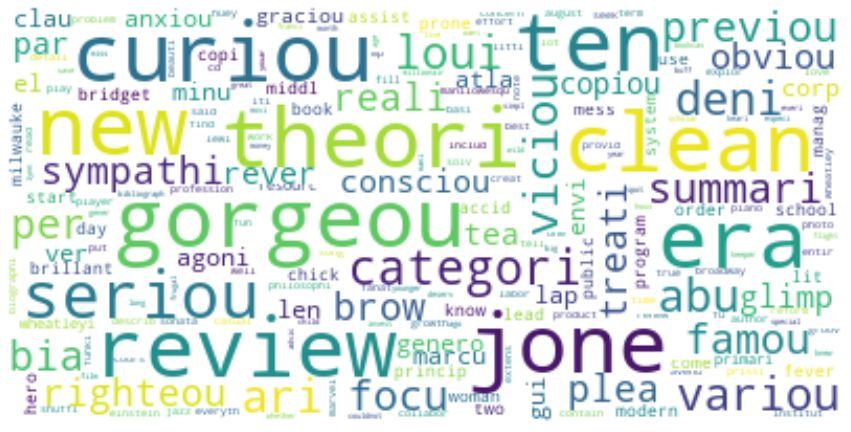

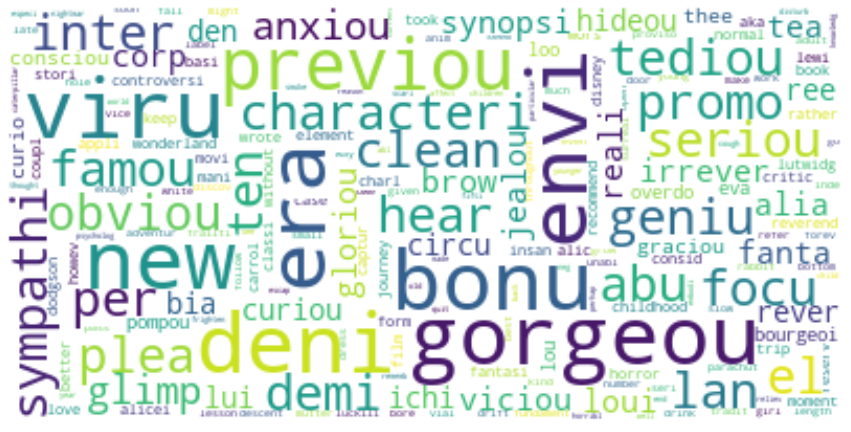

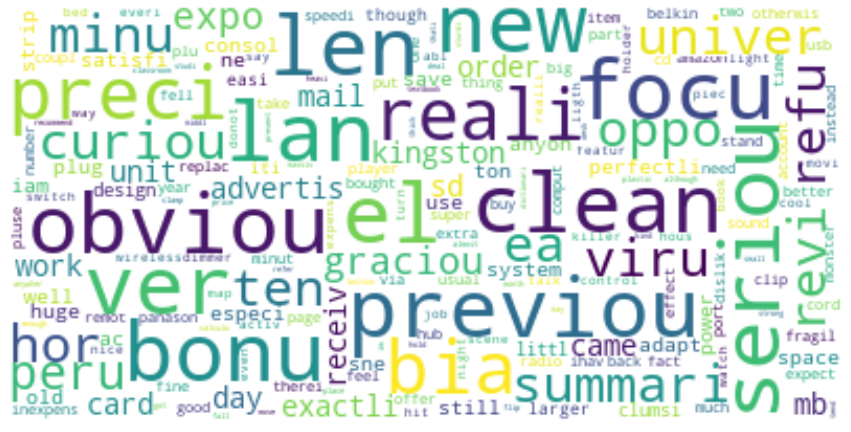

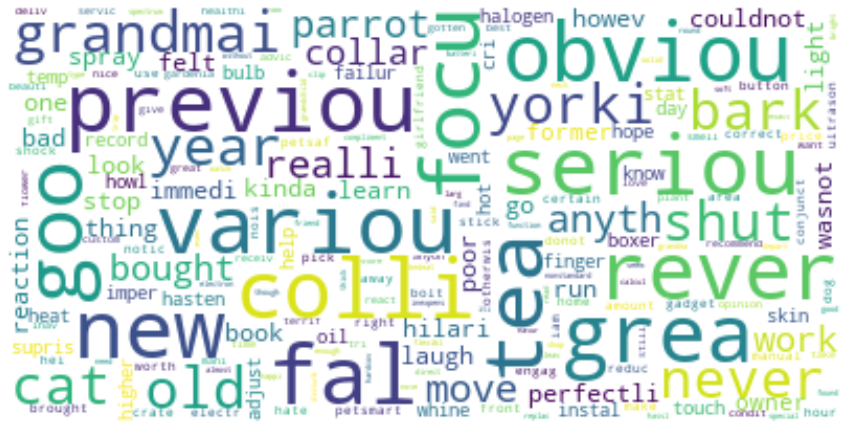

In [ ]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from wordcloud import WordCloud

for i in range(len(Processed_Domains)): 

  print("Word Cloud for Domain ", i)
  all_words = Bag_Of_Words(Processed_Domains[i])
  ax = plt.figure(figsize=(15,10))
  # Generate a word cloud image
  wordcloud = WordCloud(background_color='white',max_font_size=40).generate(' '.join(all_words.keys()))

  # Display the generated image:
  # the matplotlib way:
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  print("Total words in Domain :",len(all_words))

Ploting most important words
-  most commen words in all_words

Common words of Domain  0


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Common words of Domain  1


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


Common words of Domain  2
Common words of Domain  3


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


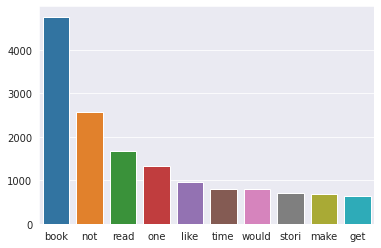

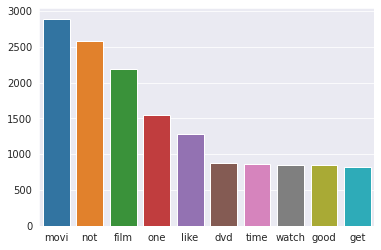

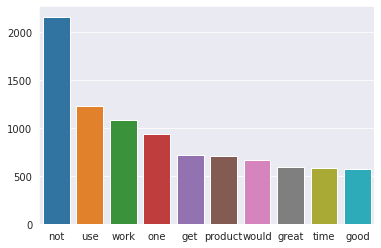

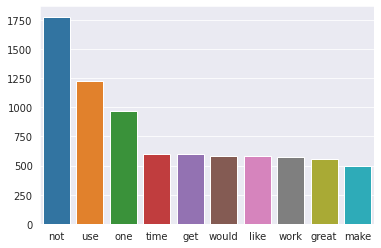

In [ ]:
import seaborn as sns
# visualize food data
from sklearn.manifold import TSNE

for i in range(len(Processed_Domains)):
  print("Common words of Domain ", i)
  all_words = Bag_Of_Words(Processed_Domains[i])
  count = []
  Words  = []
  for w in all_words.most_common(10):
      count.append(w[1])
      Words.append(w[0])
  plt.figure(i)
  sns.set_style("darkgrid")
  sns.barplot(Words,count)

### Eliminate Irrelevent Words
Words like *i, the, it, get, etc.* are not filltered by our Stop_Words so we need to handle them
-  Delete words that have less than 3 letters because generally they are Pronouns and don't add to the sentiment of the text

In [ ]:
#ListWords To lower case
def eliminate_irrelevent_Words(ListWords):

    ListWords1 = [] 
    for m in ListWords:
        l = [item.lower() for item in m]
        ListWords1.append(l)
    ListWords = ListWords1

    #print(ListWords)
    #elimnate words
    for m in ListWords:
        for w in m:
            if len(w) <=3:
                m.remove(w)
            if w == 'this':
                m.remove(w)
    return ListWords
    
def eliminate_irrelevent_Word(Word):
    #print(ListWords)
    #elimnate words
    Word = RegExpTokenizer(Word)
    Word = [item.lower() for item in Word]
    for m in Word:
        if len(m) <=3:
            Word.remove(m)
        if m == 'this':
            Word.remove(m)
    return Word

All Words length  15256


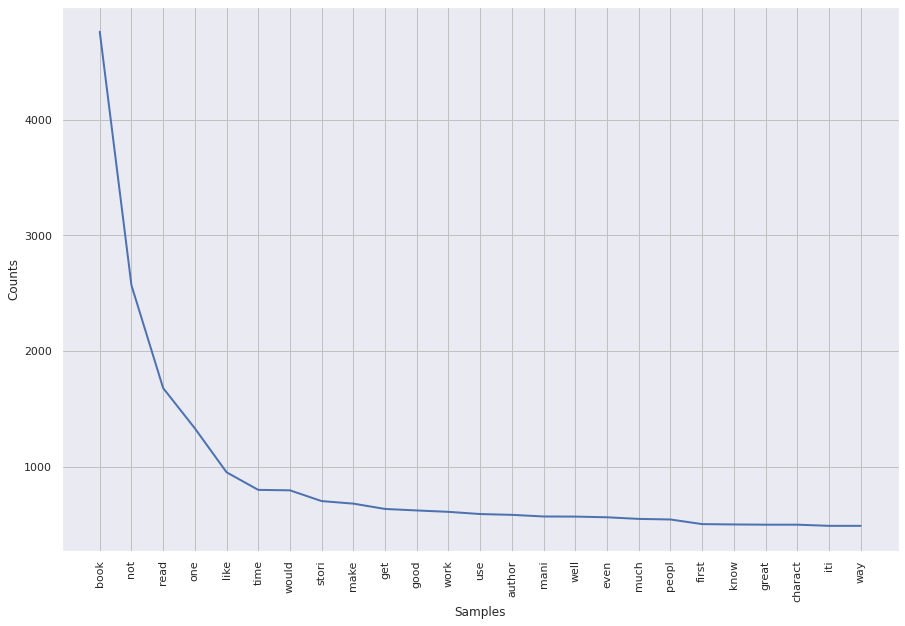

All Words length  16363


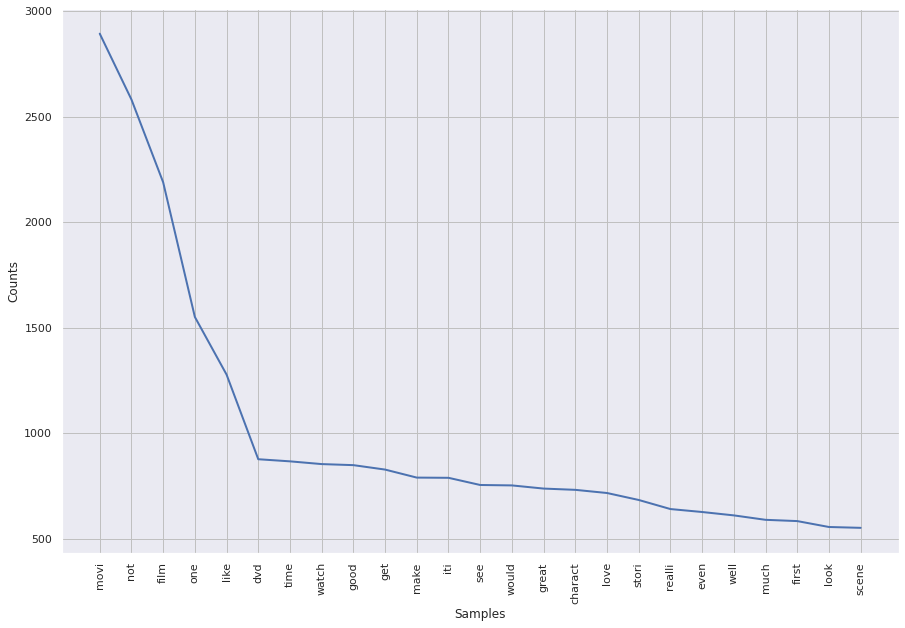

All Words length  7436


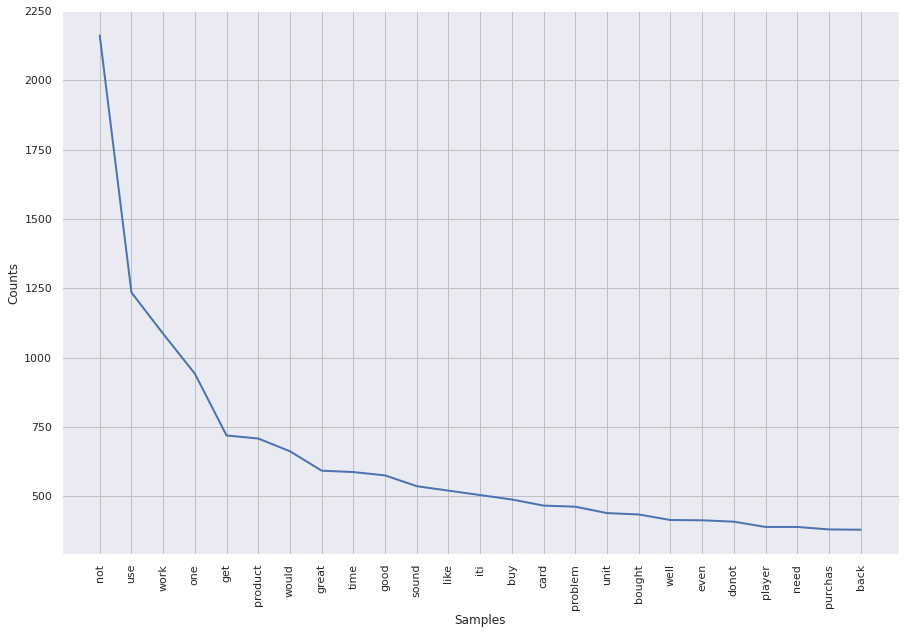

All Words length  6578


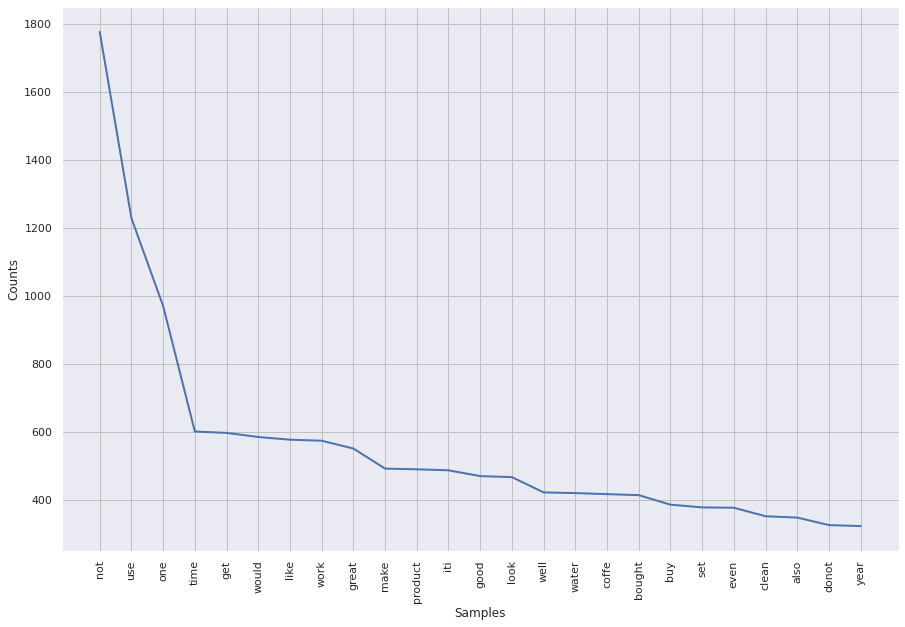

In [ ]:
for i in range(len(Processed_Domains)):

  # Figures inline and set visualization style
  ListWords = eliminate_irrelevent_Words(Processed_Domains[i])
  all_words = Bag_Of_Words(Processed_Domains[i])
  print("All Words length ",len(all_words))
  %matplotlib inline
  sns.set()
  ax = plt.figure(figsize=(15,10))# Create freq dist and plot
  freqdist1 = FreqDist(all_words)
  freqdist1.plot(25)

## **Creation of documents**

Using tuple:
-  Tuples are fixed size in nature whereas lists are dynamic. In other words, a tuple is immutable whereas a list is mutable.
- You can't add elements to a tuple. Tuples have no append or extend method.
- You can't remove elements from a tuple. Tuples have no remove or pop method.
- You can find elements in a tuple, since this doesn’t change the tuple.
- You can also use the in operator to check if an element exists in the tuple.

- **Tuples are faster** than lists. If you're defining a constant set of values and all you're ever going to do with it is iterate through it, use a tuple instead of a list.

In [ ]:
import random
def Create_Document(Dataset, ListWords):
    ListClass = list(Dataset['label'])
    Documents =  []
    for m in range(len(ListWords)):
        Documents.append((ListWords[m], ListClass[m]))
    #shuffle
    random.shuffle(Documents)
    return Documents

In [ ]:
Documents = []
for i in range(len(all_dsets)):
  Document = Create_Document(all_dsets[i], Processed_Domains[i])
  Documents.append(Document)

print(len(Documents))

4


### Find features
Return a dictionary with the words as key and existence **True**/**False**  in our dictionary of words **Most_Comm_Word**  as value
- Represents the 100 most repeated words
- E.g., ['im', 'road', 'going', 'to', 'tunisia', 'problem']

  {'could': False, 'problem': True, 'amazon': False, 'time': False, 'product': False, 'they': False, 'star': False, ...}


In [ ]:
def find_features(document,all_words,nbr_word):
    Most_Comm_Word = []    
    for w in all_words.most_common(nbr_word):
        Most_Comm_Word.append(w[0])

    word_features = Most_Comm_Word
    words = tokenize_words(document)
    #print(words)
    features = {}
    for w in word_features:
        features[w] = (w in words)

    return features

In [ ]:
import pickle
def Pickle_Save_Classifer(classifier,Test_Set):
    Classifier_o = open('NaiveBayes Score Model :'+str(nltk.classify.accuracy(classifier, Test_Set)*100)+'.pickle','wb')
    classifier = pickle.load(Classifier_o)
    Classifier_o.close()
    return classifier

In [ ]:
def Pickle_open_Classifer(path):
    SaveClassifier = open(path,'rb')
    pickle.dump(classifier,SaveClassifier)
    SaveClassifier.close()

In [ ]:
def Features_Set(all_words, Documents, nbr_word):
    #list(all_words.keys())[:1000]
    #featuresets = [(find_features(rev), category) for (rev, category) in Documents]
    featuresets = []
    for rev,cat in Documents:
        #print(' '.join(rev),cat)
        feature = find_features(' '.join(rev),all_words,nbr_word)
        #print(feature)
        featuresets.append((feature,cat))
    return featuresets

In [ ]:
book_features_set_100 = Features_Set(all_words,Documents[0],100)
dvd_features_set_100 = Features_Set(all_words,Documents[1],100)
electronic_features_set_100 = Features_Set(all_words,Documents[2],100)
kitchen_features_set_100 = Features_Set(all_words,Documents[3],100)

In [ ]:
book_features_set_300 = Features_Set(all_words,Documents[0],300)
dvd_features_set_300 = Features_Set(all_words,Documents[1],300)
electronic_features_set_300 = Features_Set(all_words,Documents[2],300)
kitchen_features_set_300 = Features_Set(all_words,Documents[3],300)

### Save DataFrame and Features Sets in csv or pickle

In [ ]:
# Pickling Book dataset
with open("Book_FeaturesSet_100Words.pql", "wb") as fp:   
    pickle.dump(book_features_set_100, fp)

# Pickling DVD dataset
with open("DVD_FeaturesSet_100Words.pql", "wb") as fp:
    pickle.dump(dvd_features_set_100, fp)

# Pickling Electronic dataset
with open("Electronic_FeaturesSet_100Words.pql", "wb") as fp:
    pickle.dump(electronic_features_set_100, fp)

# Pickling Kitchen dataset
with open("Kitchen_FeaturesSet_100Words.pql", "wb") as fp:
    pickle.dump(kitchen_features_set_100, fp)

In [ ]:
# Pickling Book dataset
with open("Book_FeaturesSet_300Words.pql", "wb") as fp:   
    pickle.dump(book_features_set_300, fp)

# Pickling DVD dataset
with open("DVD_FeaturesSet_300Words.pql", "wb") as fp:
    pickle.dump(dvd_features_set_300, fp)

# Pickling Electronic dataset
with open("Electronic_FeaturesSet_300Words.pql", "wb") as fp:
    pickle.dump(electronic_features_set_300, fp)

# Pickling Kitchen dataset
with open("Kitchen_FeaturesSet_300Words.pql", "wb") as fp:
    pickle.dump(kitchen_features_set_300, fp)

In [ ]:
header = ["text", "label"]
all_dsets[0].dataset.to_csv("Amazon_Book.csv", sep='\t', encoding='utf-8',columns=header)
all_dsets[1].dataset.to_csv("Amazon_DVD.csv", sep='\t', encoding='utf-8',columns=header)
all_dsets[2].dataset.to_csv("Amazon_Electronic.csv", sep='\t', encoding='utf-8',columns=header)
all_dsets[3].dataset.to_csv("Amazon_Kitchen.csv", sep='\t', encoding='utf-8',columns=header)

In [ ]:
with open('Amazon_Book.pkl', 'wb') as f:
    pickle.dump(Documents[0], f)

with open('Amazon_DVD.pkl', 'wb') as f:
    pickle.dump(Documents[1], f)

with open('Amazon_Electronic.pkl', 'wb') as f:
    pickle.dump(Documents[2], f)

with open('Amazon_Kitchen.pkl', 'wb') as f:
    pickle.dump(Documents[3], f)
    

Test pickle files

In [ ]:
with open("Book_FeaturesSet_100Words.pql", "rb") as fp:   # Unpickling
    b = pickle.load(fp)
    
print(b[1])

({'book': True, 'read': False, 'like': False, 'would': False, 'time': False, 'story': False, 'good': False, 'well': False, 'author': False, 'even': False, 'make': False, 'many': False, 'life': False, 'much': True, 'people': False, 'work': False, 'first': False, 'character': False, 'great': False, 'itis': False, 'also': False, 'really': False, 'know': False, 'reading': True, 'page': False, 'could': False, 'year': False, 'donot': False, 'reader': False, 'thing': False, 'find': False, 'novel': False, 'written': False, 'want': False, 'think': False, 'world': True, 'love': False, 'little': True, 'give': False, 'writing': False, 'better': True, 'found': False, 'best': False, 'need': False, 'take': False, 'chapter': False, 'never': True, 'however': False, 'history': False, 'child': False, 'not': False, 'thought': False, 'point': False, 'come': False, 'back': False, 'still': False, 'another': True, 'something': False, 'idea': True, 'made': False, 'fact': False, 'part': False, 'anyone': False, 

In [ ]:
with open('Amazon_Book.pkl', 'rb') as f:
    new_documents = pickle.load(f)

print(new_documents[1])

## **Motivation: Why Word Embeddings?**

Image and audio processing systems work with rich, high-dimensional datasets encoded as vectors of the individual raw pixel-intensities for image data, or e.g. power spectral density coefficients for audio data. For tasks like object or speech recognition we know that all the information required to successfully perform the task is encoded in the data (because humans can perform these tasks from the raw data). However, natural language processing systems traditionally treat words as discrete atomic symbols, and therefore 'cat' may be represented as Id537 and 'dog' as Id143. These encodings are arbitrary, and provide no useful information to the system regarding the relationships that may exist between the individual symbols. This means that the model can leverage very little of what it has learned about 'cats' when it is processing data about 'dogs' (such that they are both animals, four-legged, pets, etc.). Representing words as unique, discrete ids furthermore leads to data sparsity, and usually means that we may need more data in order to successfully train statistical models. Using vector representations can overcome some of these obstacles.
https://www.tensorflow.org/tutorials/word2vec
#### How word2vec works:

The idea behind word2vec is that:

    Take a 3 layer neural network. (1 input layer + 1 hidden layer + 1 output layer)
    Feed it a word and train it to predict its neighbouring word.
    Remove the last (output layer) and keep the input and hidden layer.
    Now, input a word from within the vocabulary. The output given at the hidden layer is the ‘word embedding’ of the input word.
Two popular examples of methods of learning word embeddings from text include:

    Word2Vec.
    GloVe.

In addition to these carefully designed methods, a word embedding can be learned as part of a deep learning model. This can be a slower approach, but tailors the model to a specific training dataset.

In [ ]:
import gensim, logging
from gensim.models.word2vec import Word2Vec # the word2vec model gensim class

### Train model

In [ ]:
# train model
model = Word2Vec(Processed_Domains[0], min_count=1)
# summarize the loaded model
print(model)
# summarize vocabulary
words = list(model.wv.vocab)
print("first 100 words : ",words[:100])
# access vector for one word
print(model['good'])
# save model
model.save('book_model.bin')

Word2Vec(vocab=15256, size=100, alpha=0.025)
first 100 words :  ['bridget', 'jone', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accid', 'mess', 'up', 'manag', 'come', 'book', 'start', 'chick', 'lit', 'fever', 'hero', 'order', 'copi', 'middl', 'school', 'princip', 'two', 'assist', 'lead', 'program', 'milwauke', 'public', 'system', 'use', 'wheatleyi', 'primari', 'resourc', 'profession', 'growth', 'mp', 'collabor', 'institut', 'august', 'concern', 'reform', 'seek', 'renew', 'well', 'wheatley', 'provid', 'basi', 'note', 'einstein', 'said', 'problem', 'solv', 'conscious', 'creat', 'entir', 'marvel', 'explor', 'philosophi', 'casual', 'piano', 'player', 'broadway', 'fanat', 'jazz', 'play', 'song', 'avenu', 'q', 'contain', 'everyth', 'find', 'cd', 'includ', 'product', 'photo', 'cours', 'littl', 'detail', 'fun', 'term', 'like', 'manilowesqu', 'huey', 'lewi', 'shuffl', 'prissi', 'sonata', 'funki', 'groov', 'describ', 'fu', 'one', 'best', 'biographi', 'ever', 'read', 'tell']
[-

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  if __name__ == '__main__':


Here we see the encoding of the word good in a vector a 100 dimensions

In [ ]:
print(len(model['good']))

100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


In [ ]:
#model.most_similar(positive=['good', 'best'], negative=['bad'], topn=1)
#           ability = True              pos : neg    =     10.1 : 1.0
#             waste = True              neg : pos    =     10.0 : 1.0
#             bunch = True              neg : pos    =      9.2 : 1.0
model.most_similar(positive=['good', 'best'], negative=['bore'], topn=20)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """


[('like', 0.9998317956924438),
 ('one', 0.9998257160186768),
 ('ever', 0.9998123645782471),
 ('enjoy', 0.9998094439506531),
 ('ihav', 0.9998027682304382),
 ('would', 0.999801516532898),
 ('thing', 0.9997967481613159),
 ('iti', 0.9997940063476562),
 ('great', 0.9997925758361816),
 ('finish', 0.9997848272323608),
 ('iam', 0.9997844696044922),
 ('say', 0.9997797012329102),
 ('get', 0.9997791051864624),
 ('bad', 0.9997754096984863),
 ('didnot', 0.9997752904891968),
 ('could', 0.9997738599777222),
 ('buy', 0.9997720718383789),
 ('think', 0.9997677803039551),
 ('lot', 0.9997665286064148),
 ('youwil', 0.9997656941413879)]

### Load model

In [ ]:
model = Word2Vec.load('model.bin')

In [ ]:
words = list(model.wv.vocab)
print(words[:100])

['bridget', 'jone', 'modern', 'day', 'woman', 'brillant', 'not', 'know', 'prone', 'accid', 'mess', 'up', 'manag', 'come', 'book', 'start', 'chick', 'lit', 'fever', 'hero', 'order', 'copi', 'middl', 'school', 'princip', 'two', 'assist', 'lead', 'program', 'milwauke', 'public', 'system', 'use', 'wheatleyi', 'primari', 'resourc', 'profession', 'growth', 'mp', 'collabor', 'institut', 'august', 'concern', 'reform', 'seek', 'renew', 'well', 'wheatley', 'provid', 'basi', 'note', 'einstein', 'said', 'problem', 'solv', 'conscious', 'creat', 'entir', 'marvel', 'explor', 'philosophi', 'casual', 'piano', 'player', 'broadway', 'fanat', 'jazz', 'play', 'song', 'avenu', 'q', 'contain', 'everyth', 'find', 'cd', 'includ', 'product', 'photo', 'cours', 'littl', 'detail', 'fun', 'term', 'like', 'manilowesqu', 'huey', 'lewi', 'shuffl', 'prissi', 'sonata', 'funki', 'groov', 'describ', 'fu', 'one', 'best', 'biographi', 'ever', 'read', 'tell']


### 1 - Cosine similarity

To measure how similar two words are, we need a way to measure the degree of similarity between two embedding vectors for the two words. Given two vectors $u$ and $v$, cosine similarity is defined as follows: 

$$\text{CosineSimilarity(u, v)} = \frac {u . v} {||u||_2 ||v||_2} = cos(\theta) \tag{1}$$

where $u.v$ is the dot product (or inner product) of two vectors, $||u||_2$ is the norm (or length) of the vector $u$, and $\theta$ is the angle between $u$ and $v$. This similarity depends on the angle between $u$ and $v$. If $u$ and $v$ are very similar, their cosine similarity will be close to 1; if they are dissimilar, the cosine similarity will take a smaller value. 

<img src="images/cosine_sim.png" style="width:500px;height:250px;">
<caption><center> Figure 1: The cosine of the angle between two vectors is a measure of how similar they are</center></caption>

**Exercise**: Implement the function `cosine_similarity()` to evaluate similarity between word vectors.

**Reminder**: The norm of $u$ is defined as $ ||u||_2 = \sqrt{\sum_{i=1}^{n} u_i^2}$

In [ ]:
# GRADED FUNCTION: cosine_similarity

def cosine_similarity(u, v):
    """
    Cosine similarity reflects the degree of similariy between u and v
        
    Arguments:
        u -- a word vector of shape (n,)          
        v -- a word vector of shape (n,)

    Returns:
        cosine_similarity -- the cosine similarity between u and v defined by the formula above.
    """
    
    distance = 0.0
    
    ### START CODE HERE ###
    # Compute the dot product between u and v (≈1 line)
    dot = np.dot(u,v)
    # Compute the L2 norm of u (≈1 line)
    norm_u = np.sqrt(sum(u**2))
    
    # Compute the L2 norm of v (≈1 line)
    norm_v = np.sqrt(sum(v**2))
    # Compute the cosine similarity defined by formula (1) (≈1 line)
    cosine_similarity = dot/(norm_u*norm_v)
    ### END CODE HERE ###
    
    return cosine_similarity

In [ ]:
print("cosine_similarity(good, amazing) = ", cosine_similarity(model['good'],model['disappoint']))

cosine_similarity(good, amazing) =  0.9998777941073678


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


**PCA** : a linear deterministic algorithm (principal component analysis) that tries to capture as much of the data variability in as few dimensions as possible. PCA tends to highlight large-scale structure in the data, but can distort local neighborhoods. The Embedding Projector computes the top 10 principal components, from which you can choose two or three to view.

In [ ]:
from sklearn.decomposition import PCA
X = model[model.wv.vocab]
pca = PCA(n_components=3)
result = pca.fit_transform(X)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


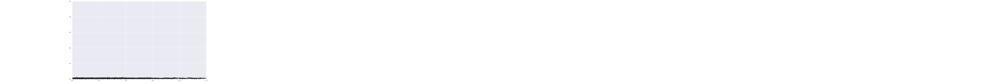

In [ ]:
f, ax = plt.subplots(figsize=(20, 12))
words = list(model.wv.vocab)
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))